# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [20]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import sys
from PIL import Image
import os
import logging
import datetime
from torchvision import transforms, datasets
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
# os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = torch.device("cuda:0")
torch.manual_seed(0) # Set for our testing purposes, please do not change!

# Save log
so = open("data_wgan.log", 'w', 10)
sys.stdout.echo = so
sys.stderr.echo = so
get_ipython().log.handlers[0].stream = so
get_ipython().log.setLevel(logging.INFO)
torch.manual_seed(0) # Set for testing purposes, please do not change!
IMG_SIZE = 32
def show_tensor_images(image_tensor, num_images=9, size=(1, IMG_SIZE, IMG_SIZE)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=3)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    
    pil_image = Image.fromarray((image_grid * 255).byte().permute(1, 2, 0).cpu().numpy())
    # pil_image.save("../Output/genterated_WGAN.svg")
    plt.savefig("../Output/wgan_output.svg")
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=100, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # self.input_dim = input_dim
        # Build the neural network
        # self.gen = nn.Sequential(
        #     self.make_gen_block(z_dim, hidden_dim * 4),
        #     self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
        #     self.make_gen_block(hidden_dim * 2, hidden_dim),
        #     self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        # )
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(z_dim, hidden_dim * 4, kernel_size=4, stride=1, bias=False),
            nn.BatchNorm2d(hidden_dim * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(hidden_dim * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(hidden_dim * 2, hidden_dim, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(hidden_dim),
            nn.ReLU(True),
            nn.ConvTranspose2d(hidden_dim, im_chan, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
mri_shape = (1, IMG_SIZE, IMG_SIZE)
n_classes = 2

n_epochs = 100
z_dim = 100
display_step = 50
batch_size = 64
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

def custom_load_dataset(data_dir):
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.Grayscale(1),
        # transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1] 
    ]

    data_transform = transforms.Compose(data_transforms)
    # Load the images from a directory using ImageFolder
    dataset = datasets.ImageFolder(data_dir, transform=data_transform)
    # Extract the images and labels from the dataset
    return dataset


train_data_dir = '/home/mark/Mark/DF/MRI_PRE/train'
train_data = custom_load_dataset(train_data_dir)
dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True)

In [5]:
#TEST
batch, label = next(iter(dataloader))
print(f"Feature batch shape: {batch.size()}")
print(f"Labels batch shape: {label.size()}")

Feature batch shape: torch.Size([64, 1, 32, 32])
Labels batch shape: torch.Size([64])


Then, you can initialize your generator, critic, and optimizers.

In [6]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


In [7]:
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [8]:
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    penalty = torch.mean((gradient_norm - 1)**2)
    return penalty

In [9]:
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    gen_loss = -1. * torch.mean(crit_fake_pred)
    return gen_loss

In [10]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    return crit_loss

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 50: Generator loss: -0.012921550516039134, critic loss: 0.88988377481699


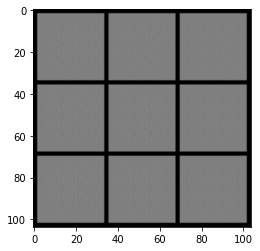

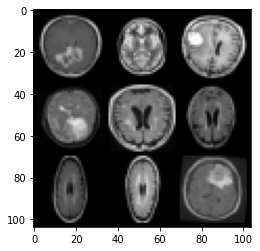

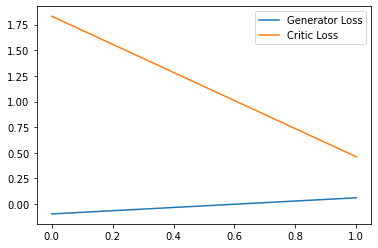

  0%|          | 0/45 [00:00<?, ?it/s]

Step 100: Generator loss: 0.1704406261444092, critic loss: 0.05182390806078908


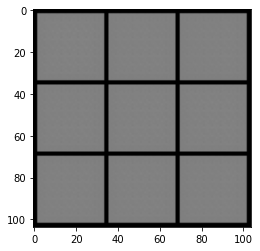

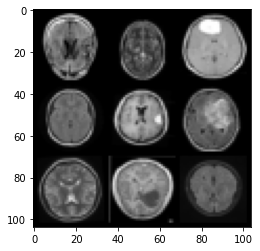

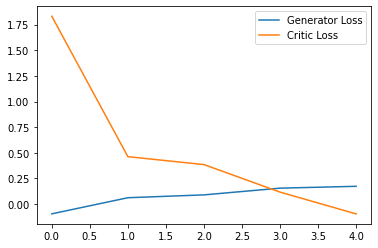

  0%|          | 0/45 [00:00<?, ?it/s]

Step 150: Generator loss: 0.4028997179493308, critic loss: -0.47517558570206164


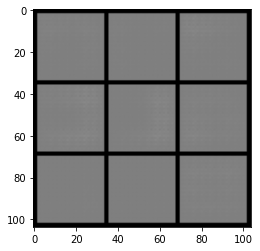

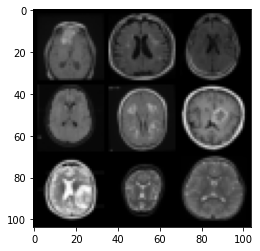

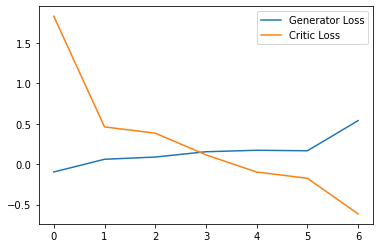

  0%|          | 0/45 [00:00<?, ?it/s]

Step 200: Generator loss: 0.7414183253049851, critic loss: -1.066757457017899


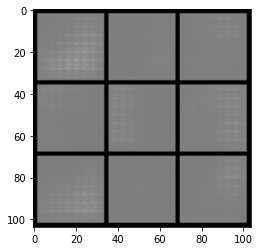

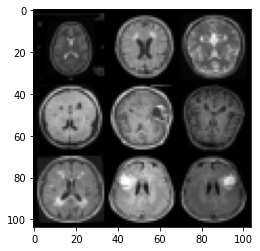

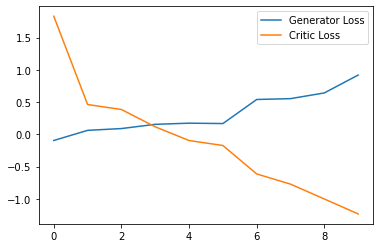

  0%|          | 0/45 [00:00<?, ?it/s]

Step 250: Generator loss: 1.2724304580688477, critic loss: -1.465008397579194


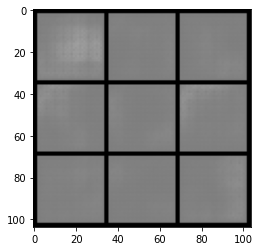

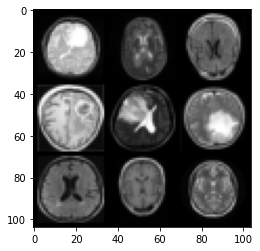

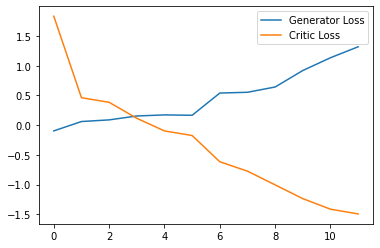

  0%|          | 0/45 [00:00<?, ?it/s]

Step 300: Generator loss: 1.5902640628814697, critic loss: -1.5771240596771239


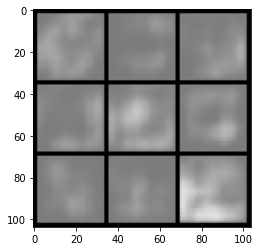

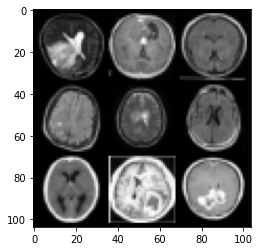

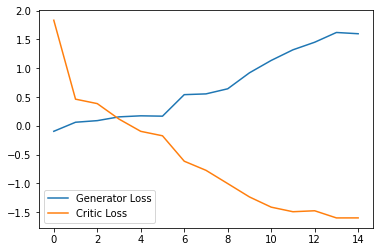

  0%|          | 0/45 [00:00<?, ?it/s]

Step 350: Generator loss: 1.5507281398773194, critic loss: -1.3965645622014997


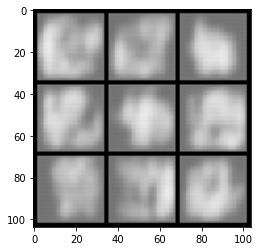

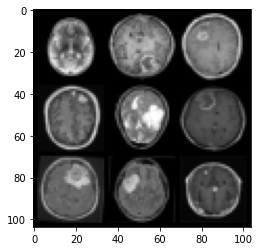

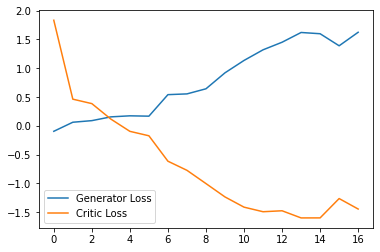

  0%|          | 0/45 [00:00<?, ?it/s]

Step 400: Generator loss: 1.585289859175682, critic loss: -1.4014588781595227


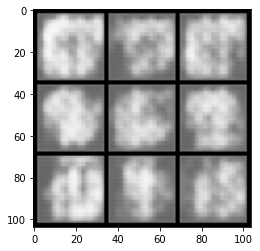

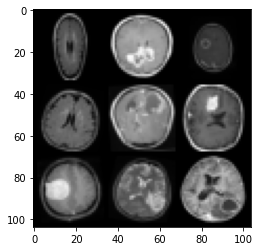

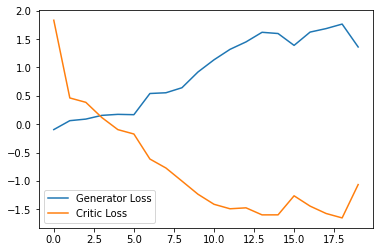

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 450: Generator loss: 1.8986251497268676, critic loss: -1.4264541575908667


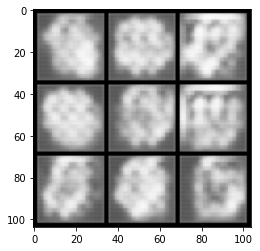

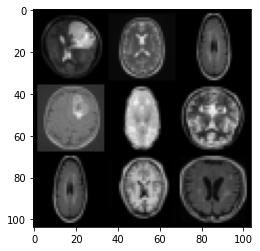

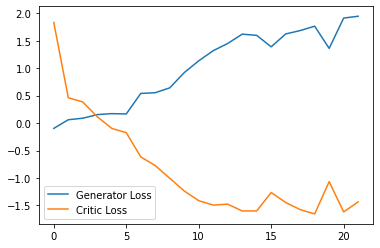

  0%|          | 0/45 [00:00<?, ?it/s]

Step 500: Generator loss: 2.2207904720306395, critic loss: -1.5545142071247096


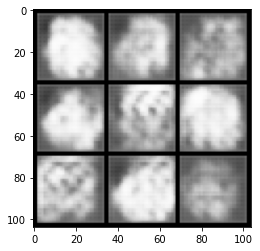

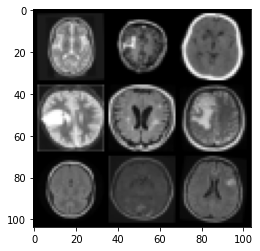

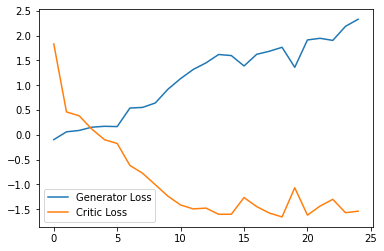

  0%|          | 0/45 [00:00<?, ?it/s]

Step 550: Generator loss: 2.7001277303695677, critic loss: -1.4979002348184585


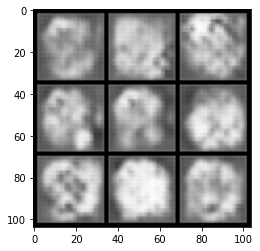

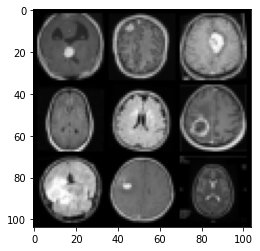

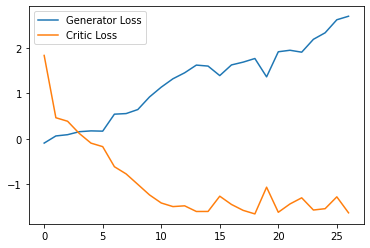

  0%|          | 0/45 [00:00<?, ?it/s]

Step 600: Generator loss: 3.3137895393371584, critic loss: -1.2890743535161016


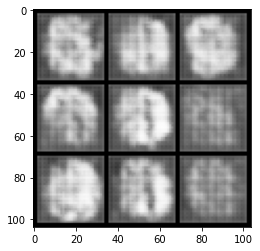

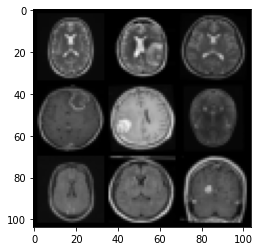

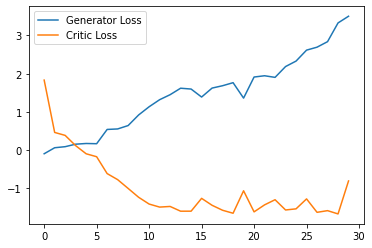

  0%|          | 0/45 [00:00<?, ?it/s]

Step 650: Generator loss: 3.720824499130249, critic loss: -1.5323471441268928


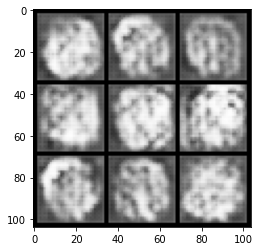

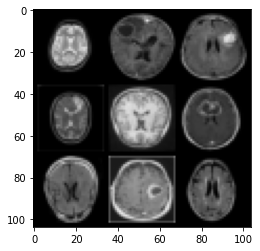

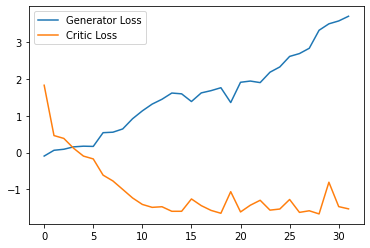

  0%|          | 0/45 [00:00<?, ?it/s]

Step 700: Generator loss: 4.018865442276001, critic loss: -1.3781960208415984


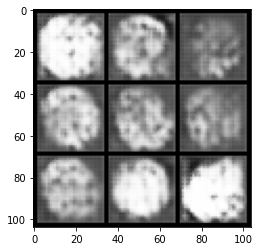

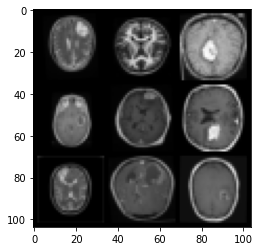

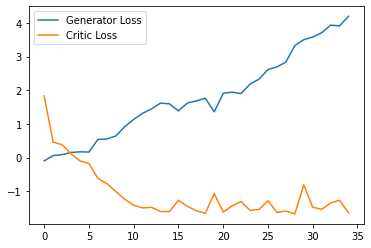

  0%|          | 0/45 [00:00<?, ?it/s]

Step 750: Generator loss: 4.416905207633972, critic loss: -1.652928450226784


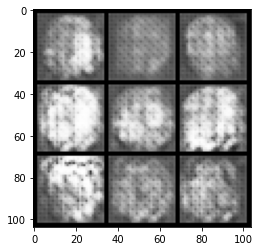

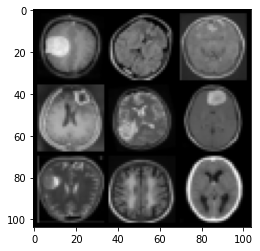

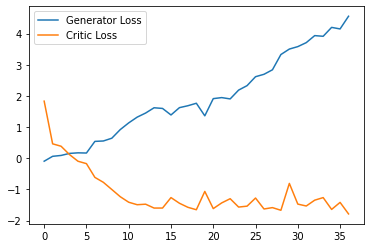

  0%|          | 0/45 [00:00<?, ?it/s]

Step 800: Generator loss: 4.723120651245117, critic loss: -1.1797029286324976


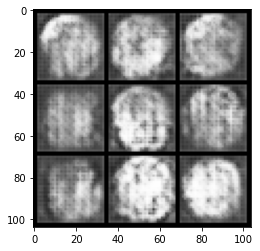

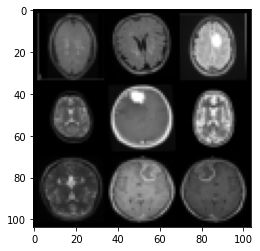

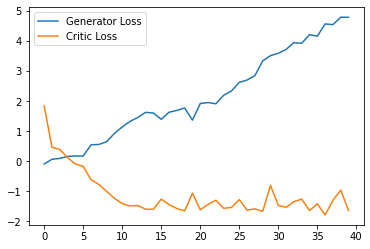

  0%|          | 0/45 [00:00<?, ?it/s]

Step 850: Generator loss: 4.807744483947754, critic loss: -1.1819991629719735


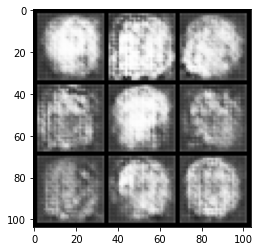

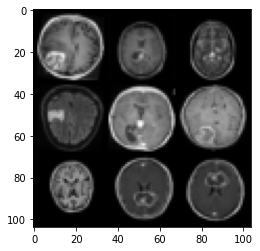

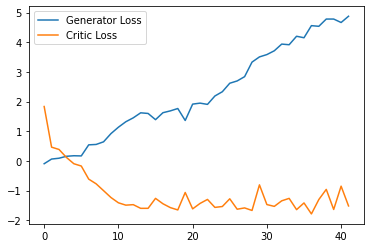

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 900: Generator loss: 5.119188251495362, critic loss: -1.0060823254585267


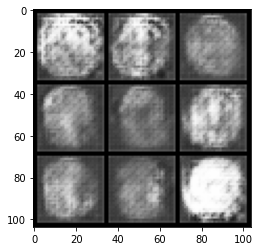

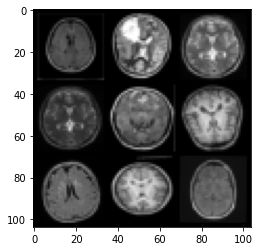

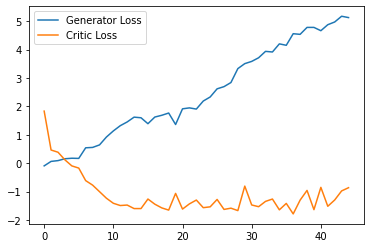

  0%|          | 0/45 [00:00<?, ?it/s]

Step 950: Generator loss: 5.173483686447144, critic loss: -0.8399084430932997


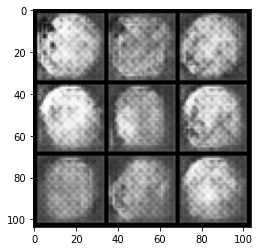

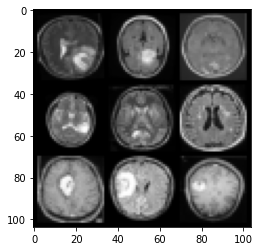

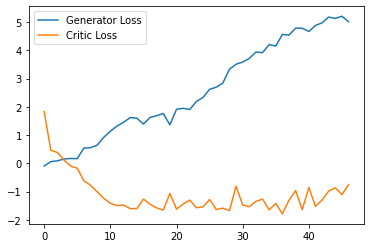

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1000: Generator loss: 5.309790887832642, critic loss: -0.7240807142853737


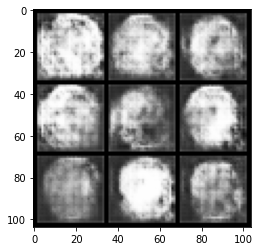

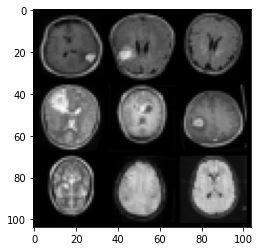

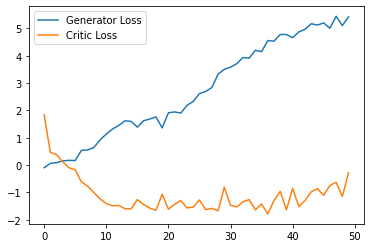

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1050: Generator loss: 5.578780679702759, critic loss: -0.859433810353279


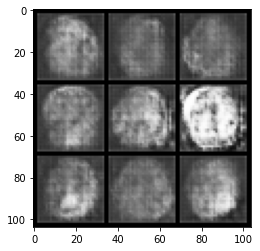

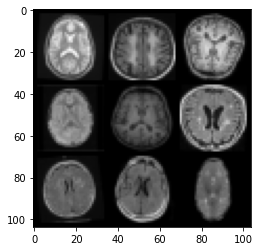

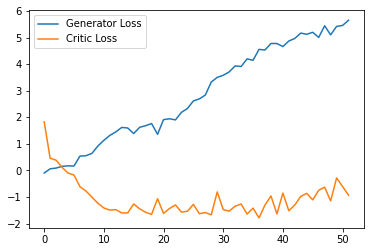

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1100: Generator loss: 5.686966753005981, critic loss: -0.7867740610241891


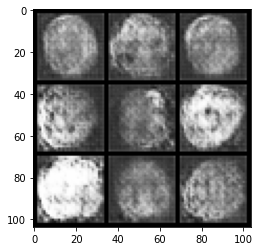

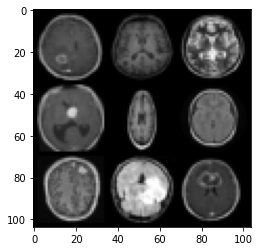

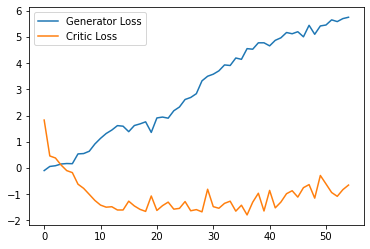

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1150: Generator loss: 5.706019458770752, critic loss: -0.9029039579629898


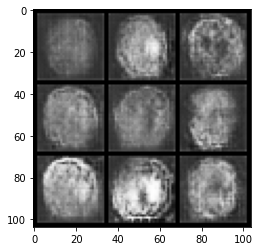

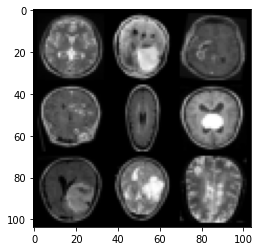

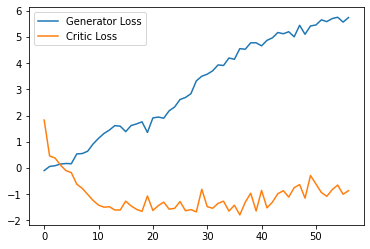

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1200: Generator loss: 5.946488161087036, critic loss: -0.25373719178512677


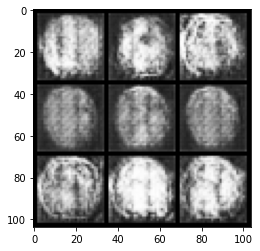

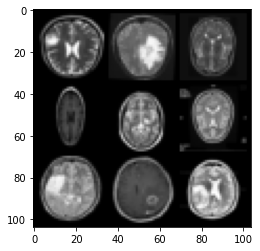

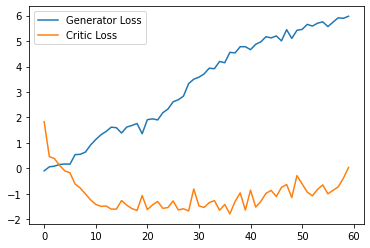

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1250: Generator loss: 6.144253587722778, critic loss: -0.13659446833282712


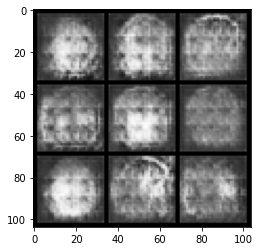

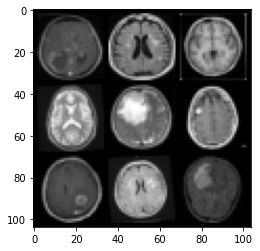

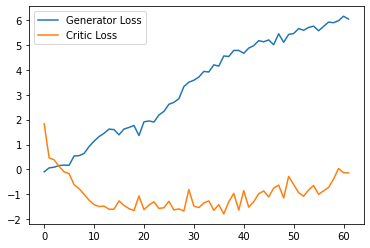

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1300: Generator loss: 6.664512977600098, critic loss: -0.22038766101002694


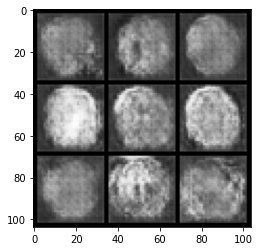

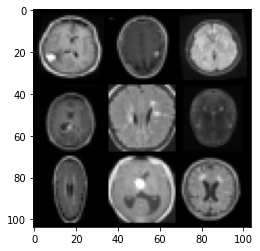

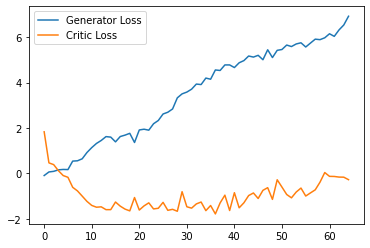

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1350: Generator loss: 7.066132078170776, critic loss: -0.3048909193277359


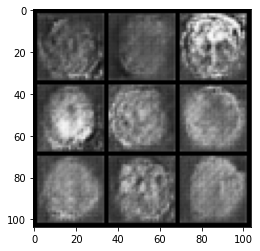

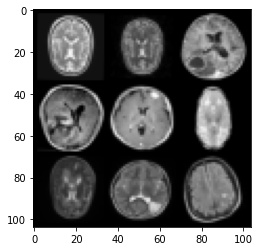

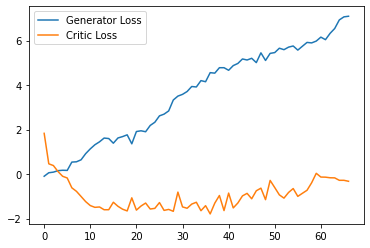

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1400: Generator loss: 7.160477724075317, critic loss: -0.3555251173973083


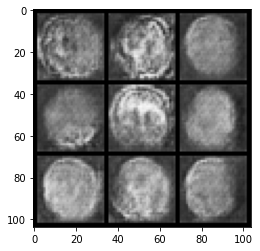

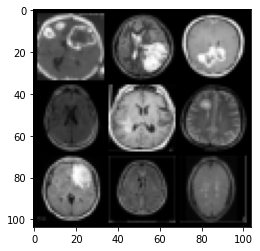

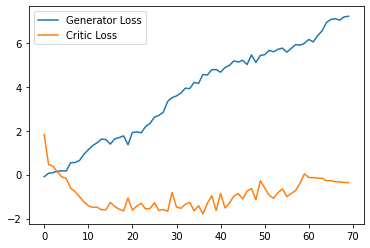

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1450: Generator loss: 7.2632769680023195, critic loss: -0.3887540795803071


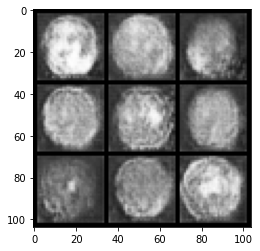

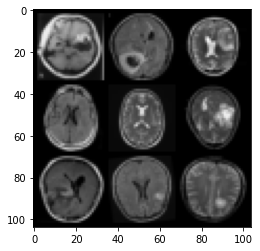

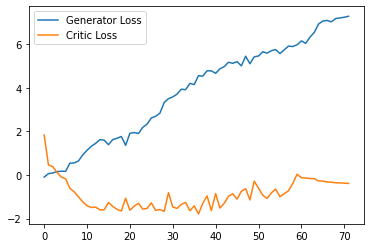

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1500: Generator loss: 7.354039449691772, critic loss: -0.3982761978507041


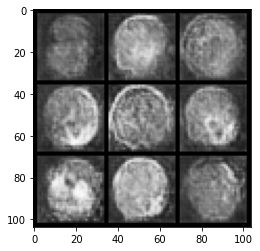

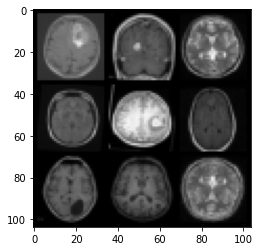

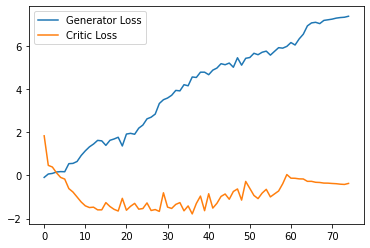

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1550: Generator loss: 7.418426237106323, critic loss: -0.43532585728168494


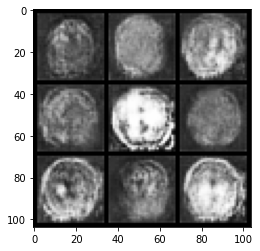

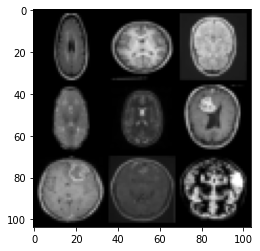

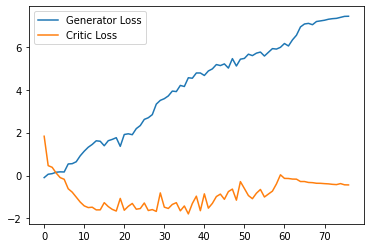

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1600: Generator loss: 7.4865877723693846, critic loss: -0.3792383743524552


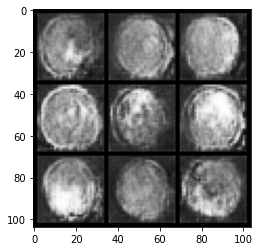

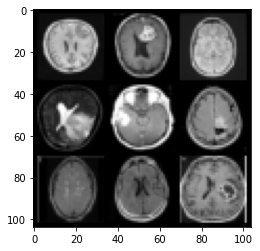

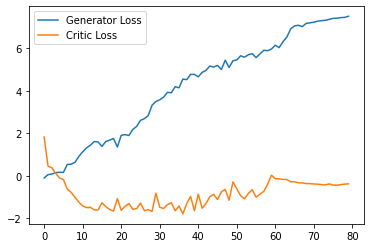

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1650: Generator loss: 7.47758487701416, critic loss: -0.3739906378388405


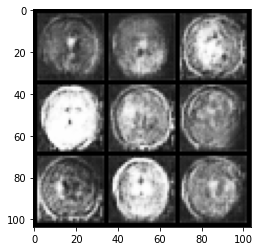

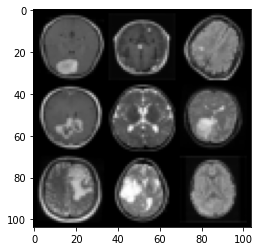

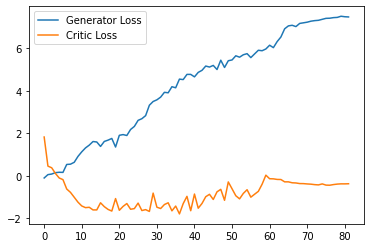

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1700: Generator loss: 7.492497205734253, critic loss: -0.3419792909026146


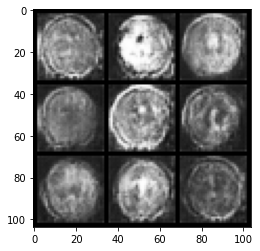

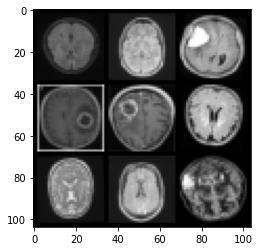

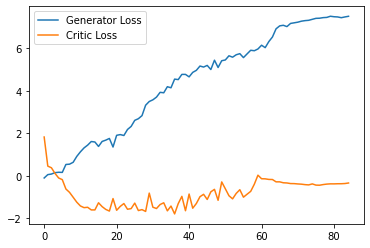

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1750: Generator loss: 7.448990039825439, critic loss: -0.3298160207271576


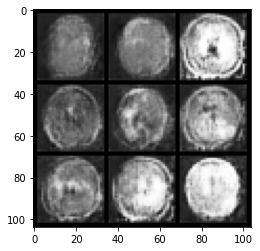

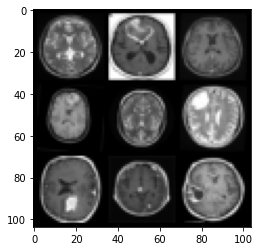

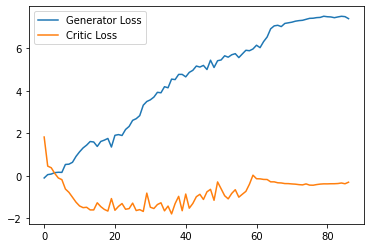

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1800: Generator loss: 7.414893846511841, critic loss: -0.2768747370839118


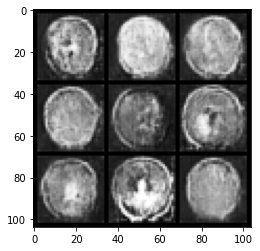

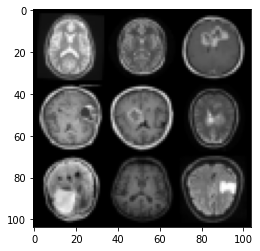

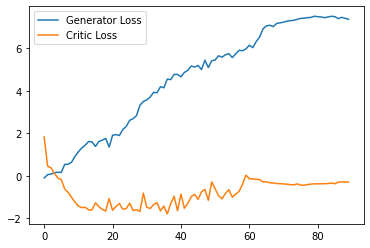

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1850: Generator loss: 7.448460159301757, critic loss: -0.26300650906562795


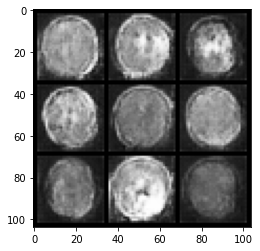

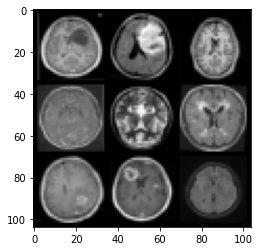

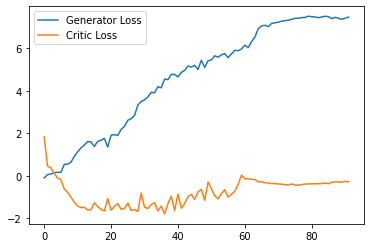

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1900: Generator loss: 7.503390789031982, critic loss: -0.24825988304615015


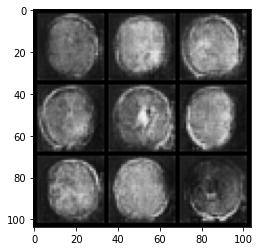

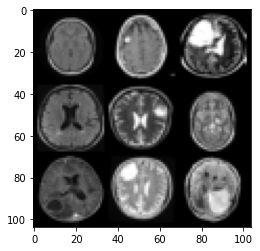

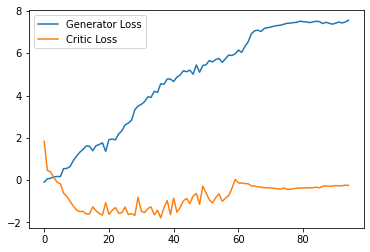

  0%|          | 0/45 [00:00<?, ?it/s]

Step 1950: Generator loss: 7.523042001724243, critic loss: -0.25497428065538413


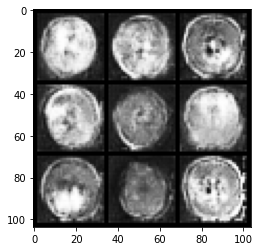

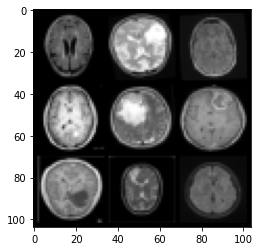

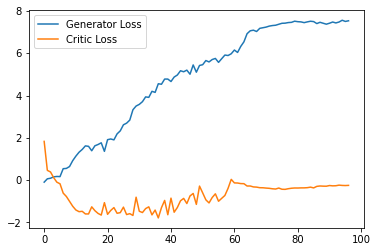

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2000: Generator loss: 7.502139368057251, critic loss: -0.24261199718713758


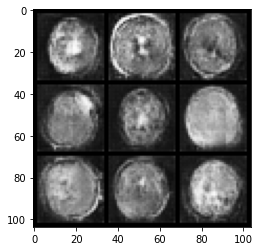

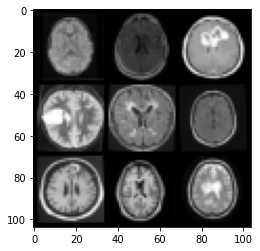

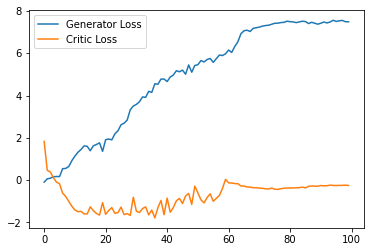

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2050: Generator loss: 7.53680100440979, critic loss: -0.23290342953801155


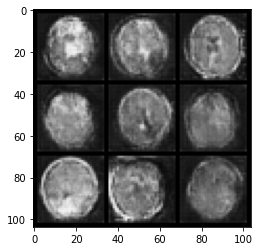

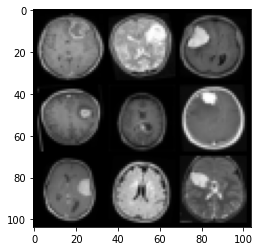

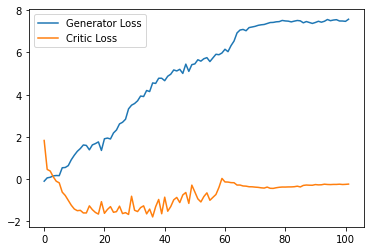

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2100: Generator loss: 7.745246496200561, critic loss: -0.19084465188533067


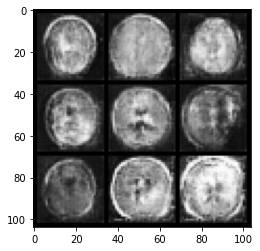

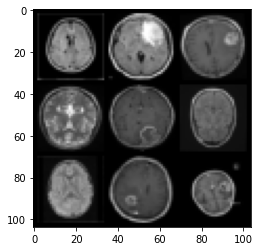

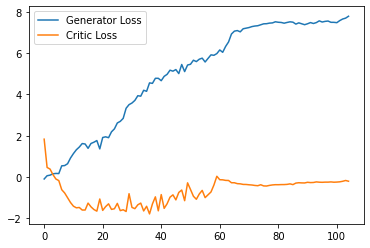

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2150: Generator loss: 7.690076427459717, critic loss: -0.21058807736635213


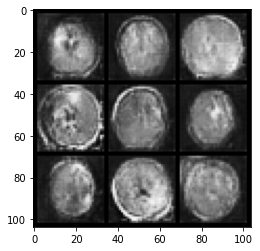

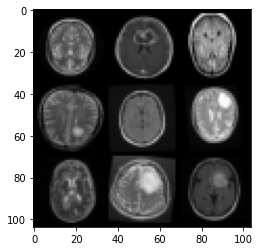

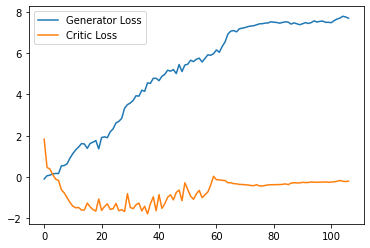

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2200: Generator loss: 7.562051420211792, critic loss: -0.2073068293631077


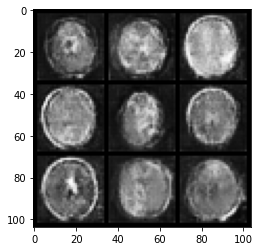

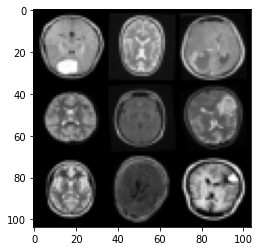

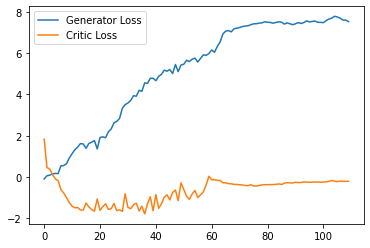

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2250: Generator loss: 7.42738787651062, critic loss: -0.20486283740401265


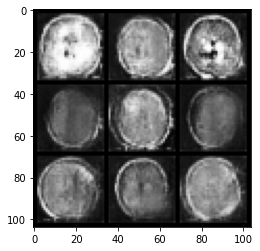

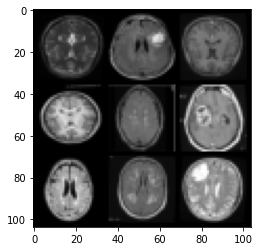

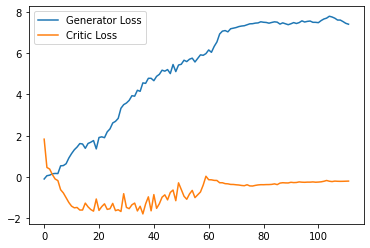

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2300: Generator loss: 7.568693904876709, critic loss: -0.17584892354905604


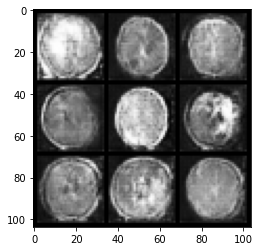

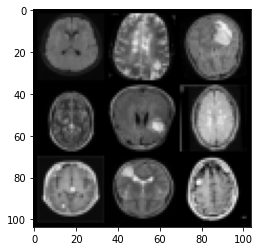

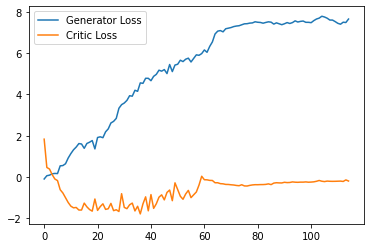

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2350: Generator loss: 7.661639060974121, critic loss: -0.1832851811051369


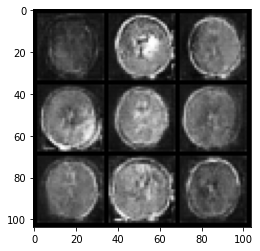

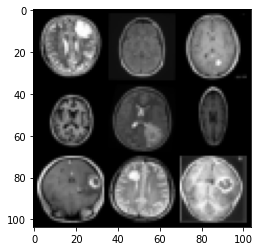

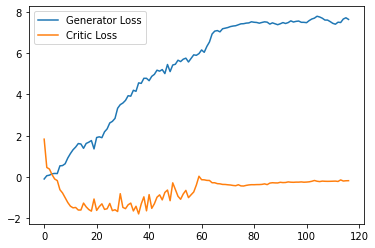

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2400: Generator loss: 7.529128198623657, critic loss: -0.18626215040683747


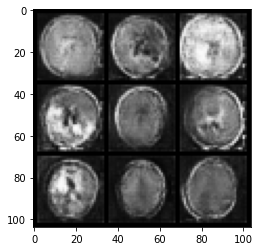

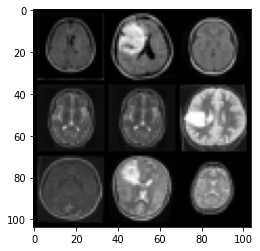

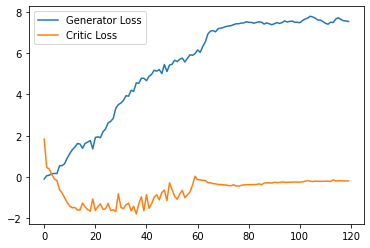

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2450: Generator loss: 7.568958148956299, critic loss: -0.18608238375186914


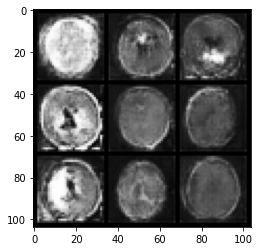

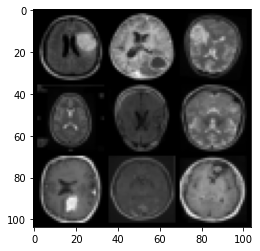

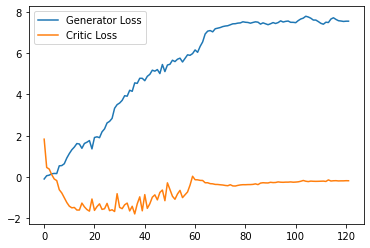

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2500: Generator loss: 7.596501474380493, critic loss: -0.17644884838163857


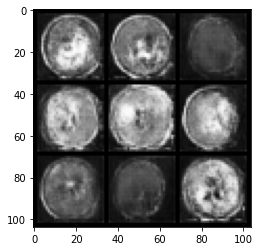

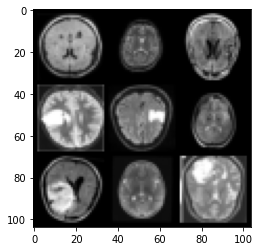

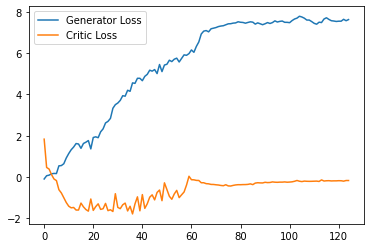

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2550: Generator loss: 7.7051284217834475, critic loss: -0.1796270228922367


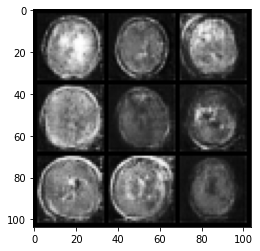

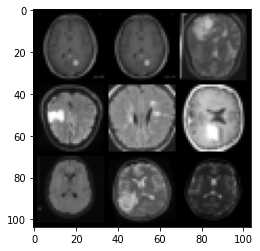

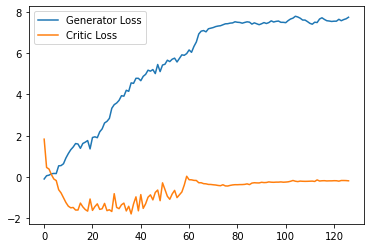

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2600: Generator loss: 7.7078212642669675, critic loss: -0.16796598681807512


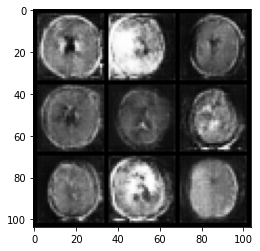

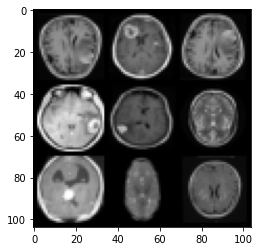

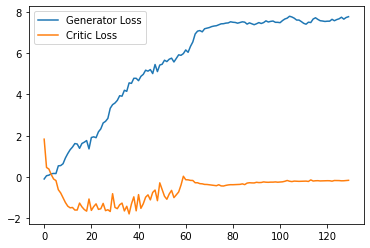

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2650: Generator loss: 7.7036943531036375, critic loss: -0.17176214128732684


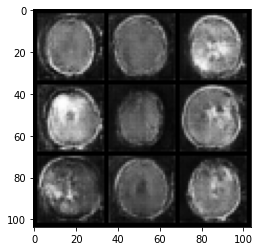

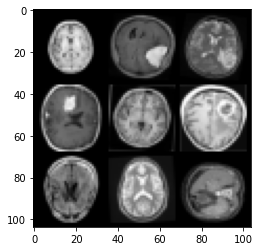

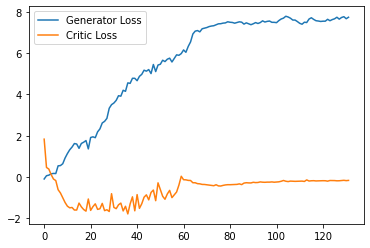

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2700: Generator loss: 7.663345384597778, critic loss: -0.172864177107811


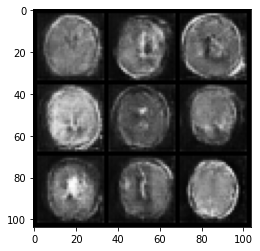

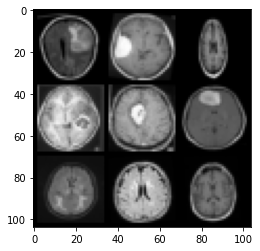

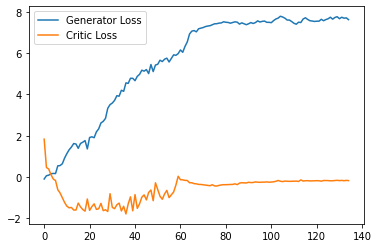

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2750: Generator loss: 7.638649492263794, critic loss: -0.16876165191829207


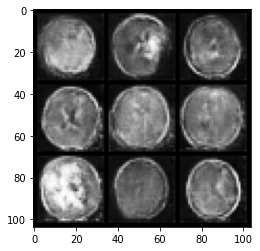

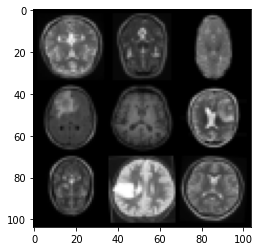

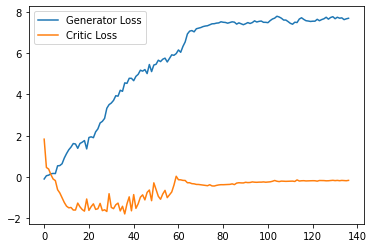

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2800: Generator loss: 7.690045013427734, critic loss: -0.16450081899762156


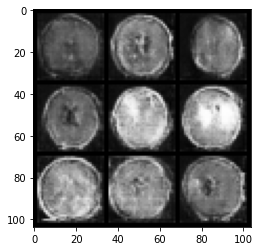

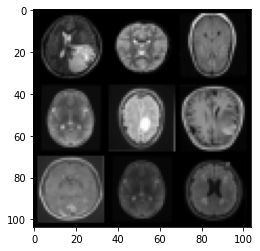

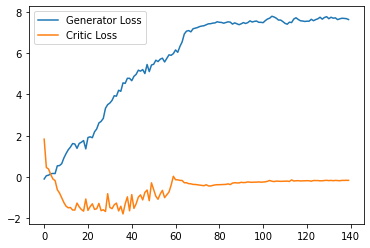

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2850: Generator loss: 7.629075078964234, critic loss: -0.16862823927402495


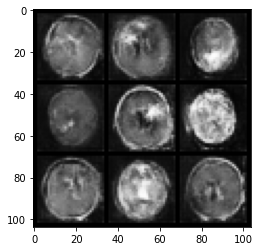

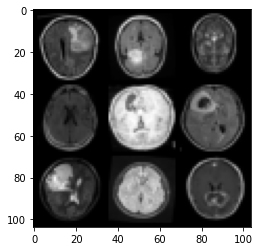

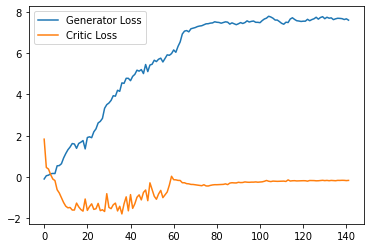

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2900: Generator loss: 7.63444151878357, critic loss: -0.1634581326842309


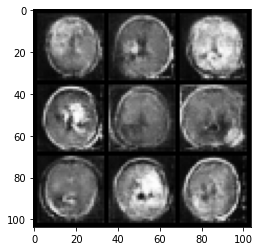

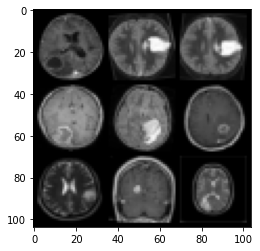

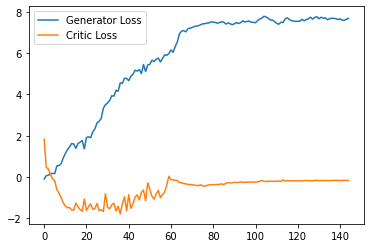

  0%|          | 0/45 [00:00<?, ?it/s]

Step 2950: Generator loss: 7.547348604202271, critic loss: -0.15041825496405364


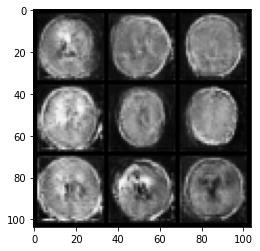

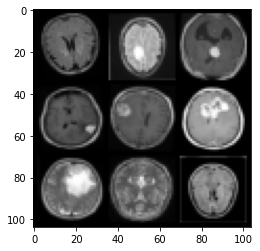

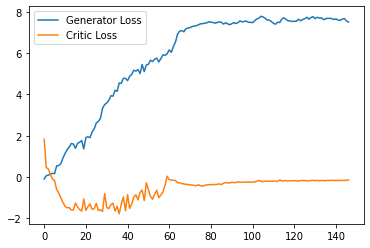

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3000: Generator loss: 7.652796211242676, critic loss: -0.16578316970169543


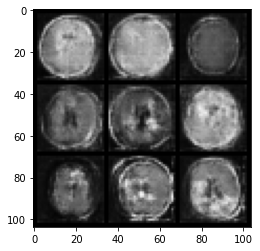

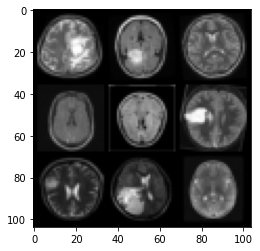

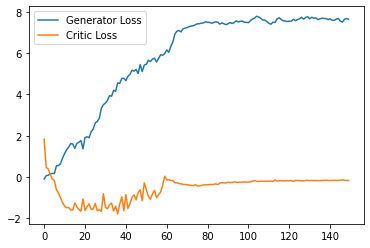

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3050: Generator loss: 7.564988660812378, critic loss: -0.16403060269355774


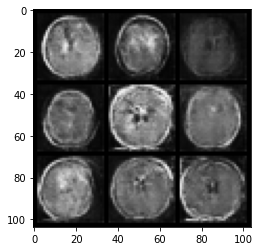

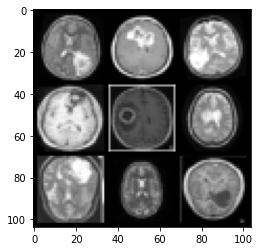

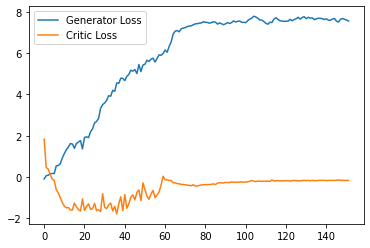

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3100: Generator loss: 7.502745628356934, critic loss: -0.16172036135196688


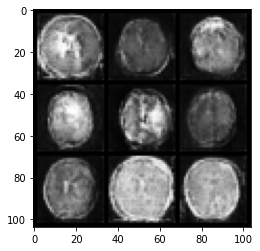

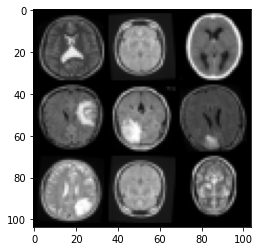

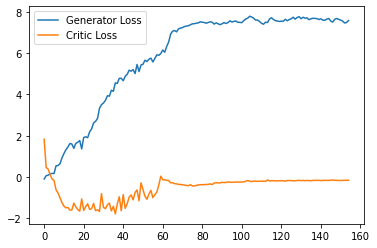

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3150: Generator loss: 7.498331880569458, critic loss: -0.16483452628552914


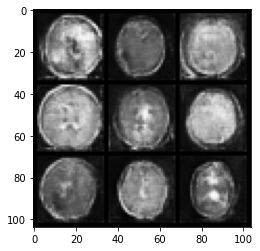

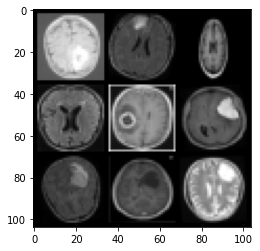

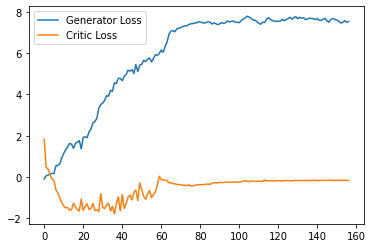

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3200: Generator loss: 7.562018957138061, critic loss: -0.16477727140486242


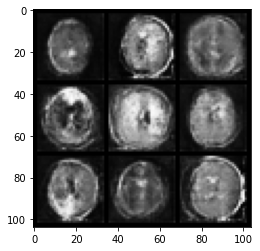

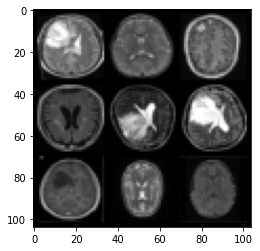

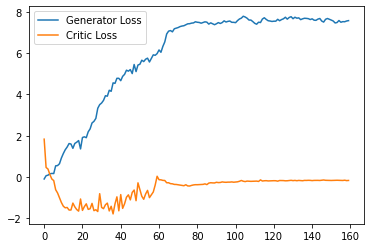

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3250: Generator loss: 7.468885173797608, critic loss: -0.16026370197534556


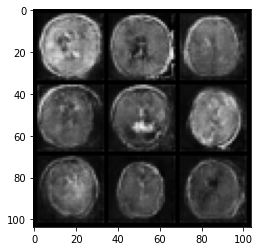

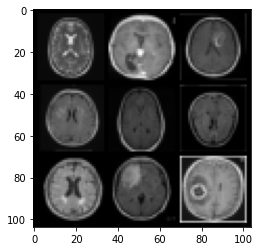

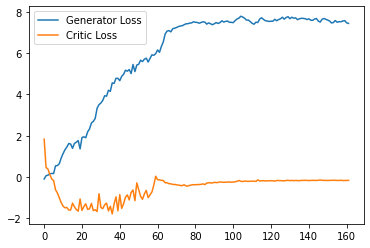

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3300: Generator loss: 7.430258579254151, critic loss: -0.1585390703976154


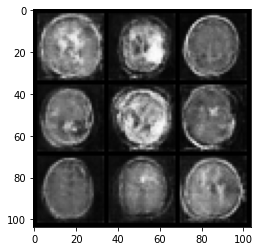

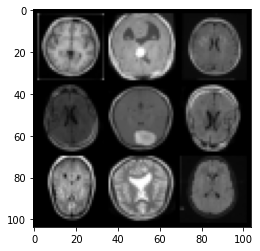

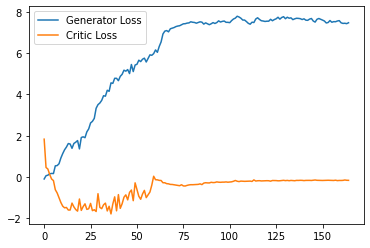

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3350: Generator loss: 7.3660054111480715, critic loss: -0.1642192037701607


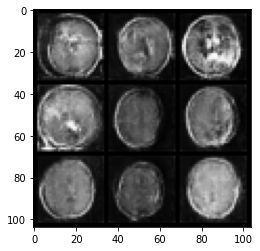

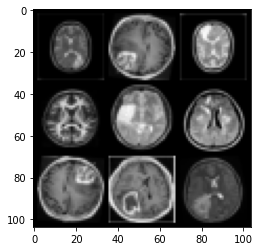

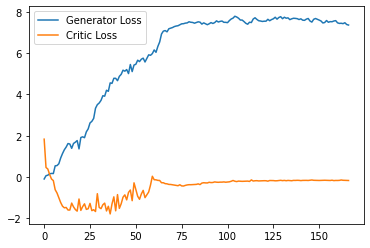

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3400: Generator loss: 7.342276954650879, critic loss: -0.16923433298617602


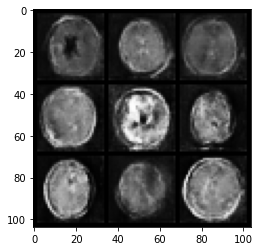

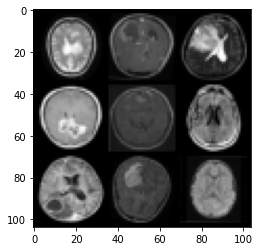

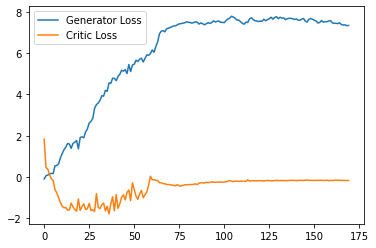

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3450: Generator loss: 7.29243761062622, critic loss: -0.15613292130827905


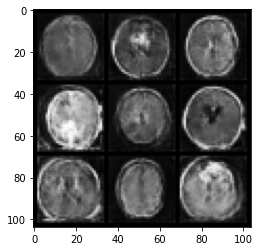

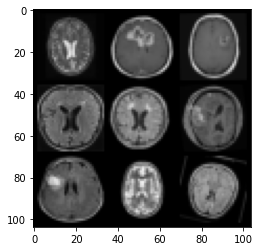

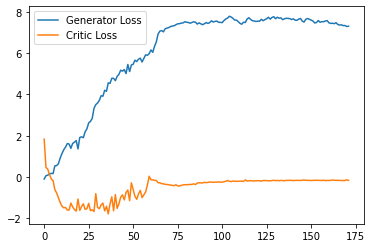

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3500: Generator loss: 7.266415205001831, critic loss: -0.16193237303197386


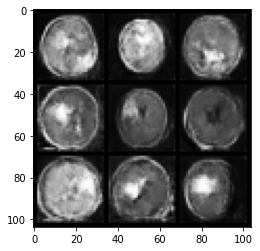

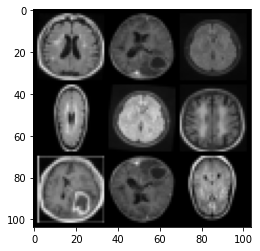

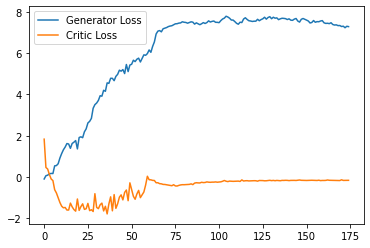

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3550: Generator loss: 7.287420244216919, critic loss: -0.15803505727648737


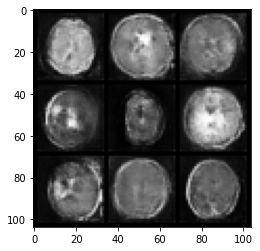

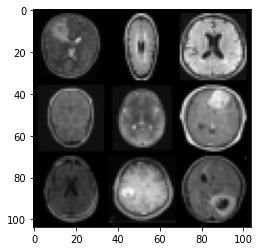

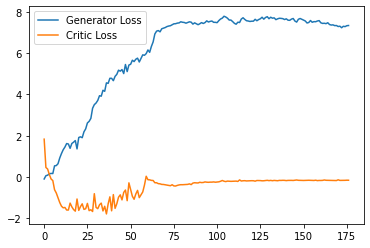

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3600: Generator loss: 7.226433000564575, critic loss: -0.1617769604176283


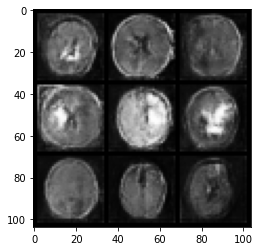

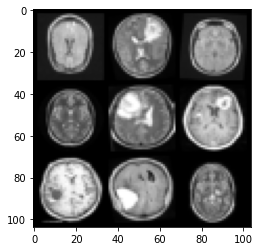

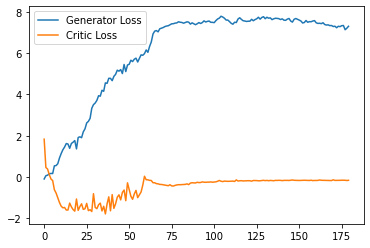

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3650: Generator loss: 7.254173393249512, critic loss: -0.16027669173479078


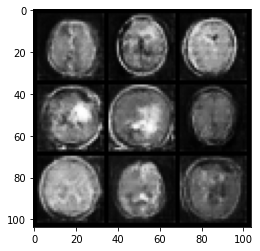

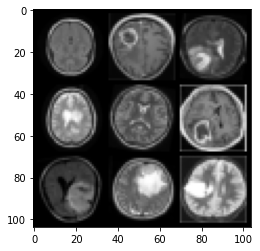

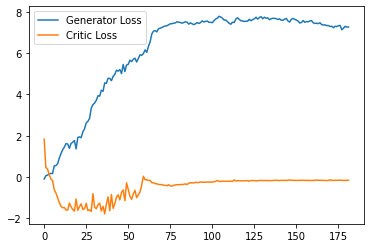

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3700: Generator loss: 7.224152860641479, critic loss: -0.1579411335885525


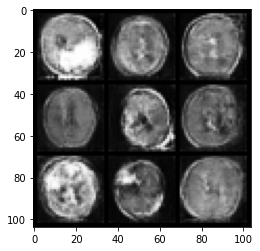

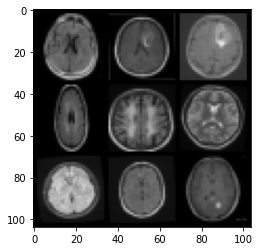

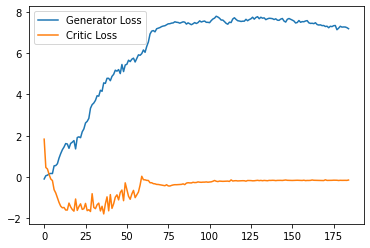

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3750: Generator loss: 7.190666370391845, critic loss: -0.15597596204280856


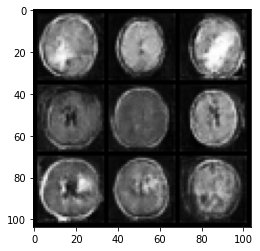

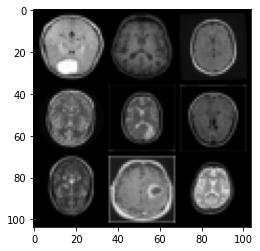

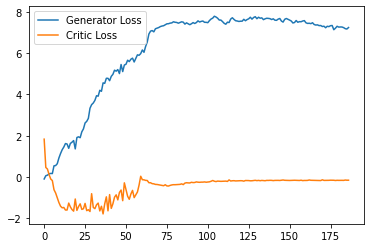

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3800: Generator loss: 7.200335741043091, critic loss: -0.1540010059773922


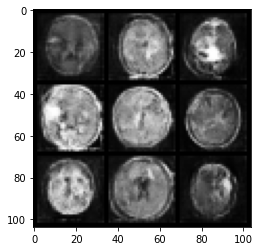

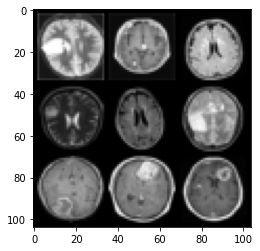

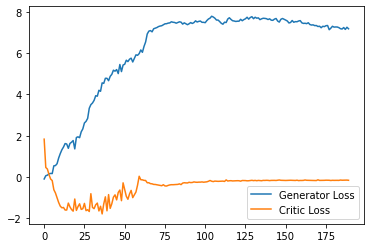

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3850: Generator loss: 7.1477350234985355, critic loss: -0.16141547134518625


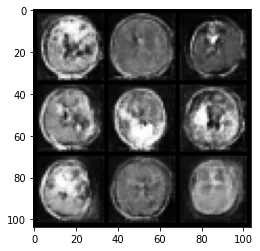

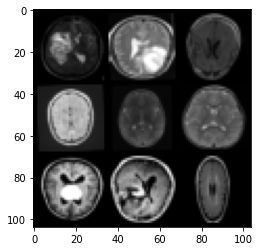

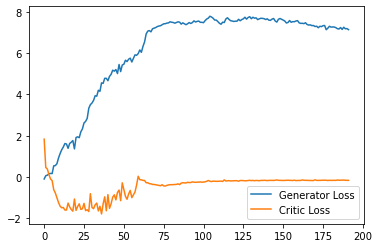

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3900: Generator loss: 7.173229837417603, critic loss: -0.15762222456932073


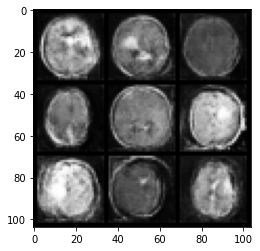

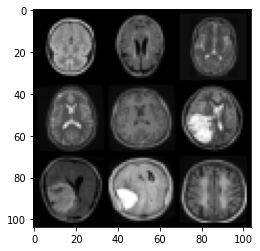

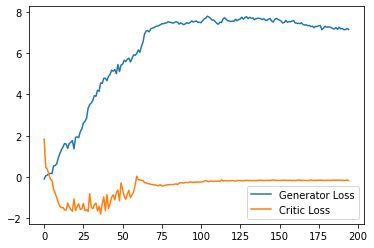

  0%|          | 0/45 [00:00<?, ?it/s]

Step 3950: Generator loss: 7.1696834373474125, critic loss: -0.1604815078675747


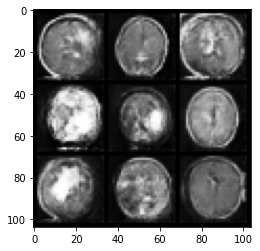

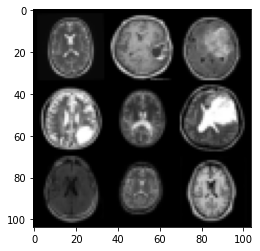

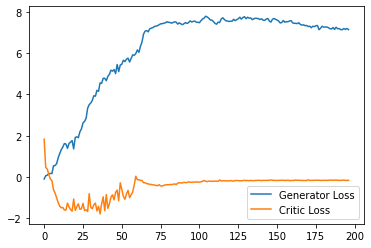

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4000: Generator loss: 7.180383787155152, critic loss: -0.15546314385533333


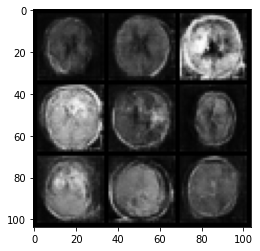

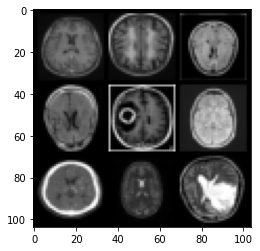

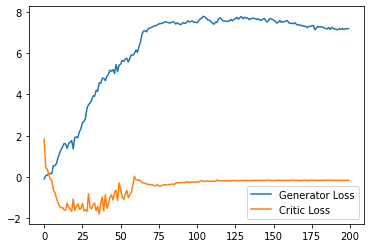

  0%|          | 0/45 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4050: Generator loss: 7.093489780426025, critic loss: -0.1563780086040497


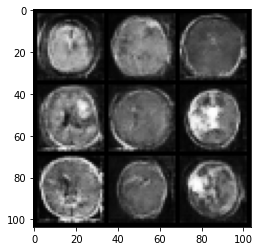

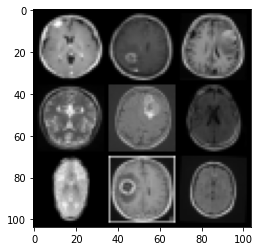

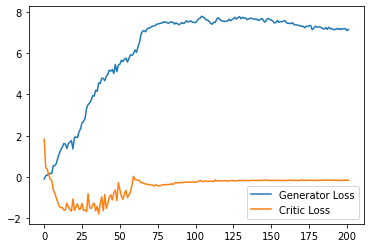

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4100: Generator loss: 7.124718379974365, critic loss: -0.16152737006545062


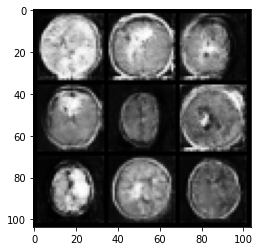

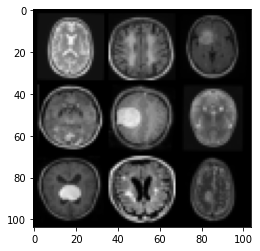

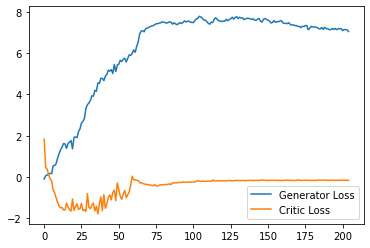

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4150: Generator loss: 7.141139945983887, critic loss: -0.14651695108413695


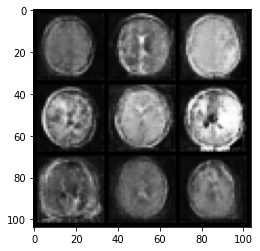

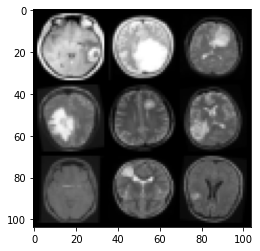

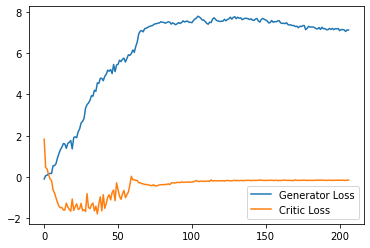

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4200: Generator loss: 7.166324739456177, critic loss: -0.15223112636804578


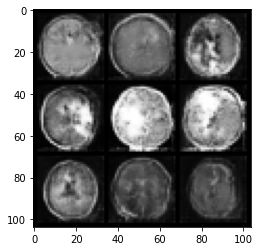

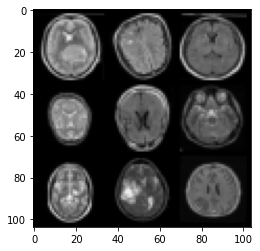

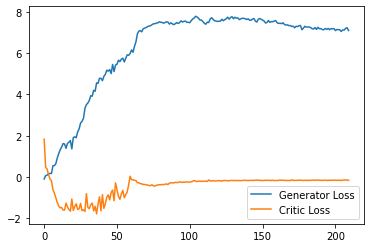

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4250: Generator loss: 7.1827543830871585, critic loss: -0.1568992096036673


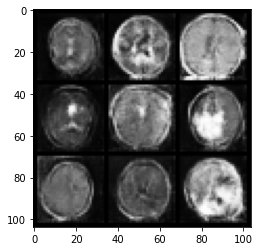

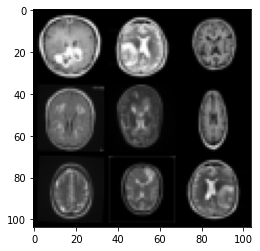

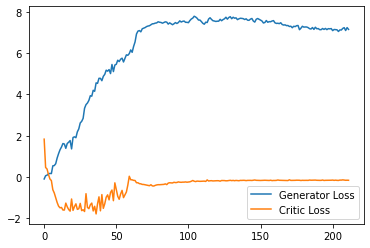

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4300: Generator loss: 7.189655847549439, critic loss: -0.14942098541557786


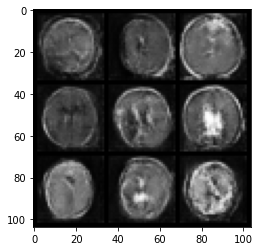

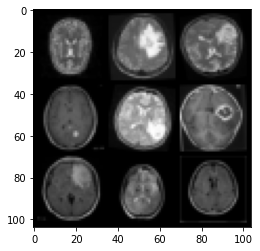

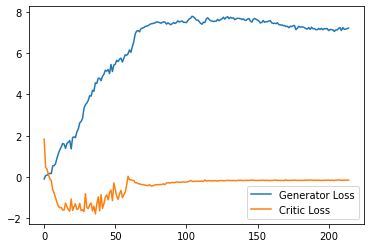

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4350: Generator loss: 7.203453798294067, critic loss: -0.15035232146084307


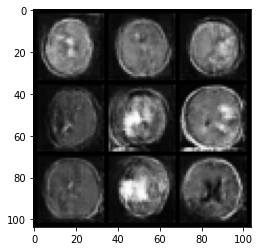

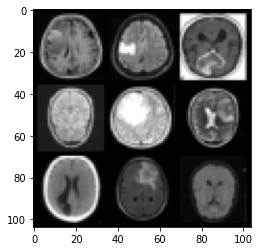

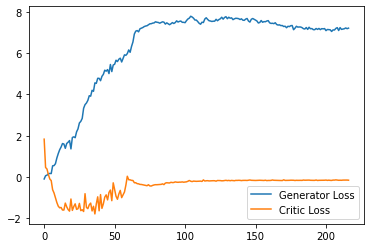

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4400: Generator loss: 7.235272779464721, critic loss: -0.15133351273834703


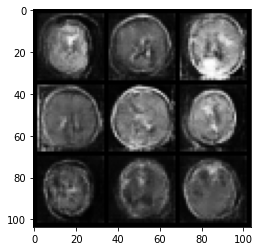

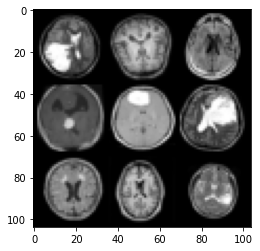

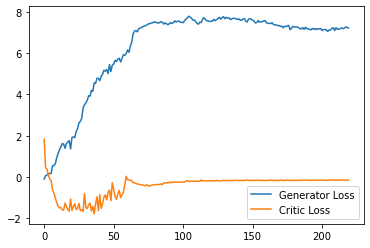

  0%|          | 0/45 [00:00<?, ?it/s]

Step 4450: Generator loss: 7.24296630859375, critic loss: -0.14723322845995424


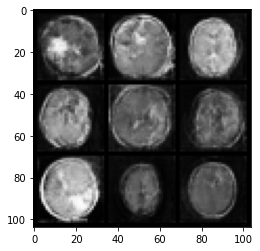

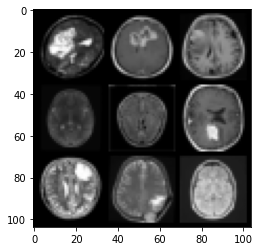

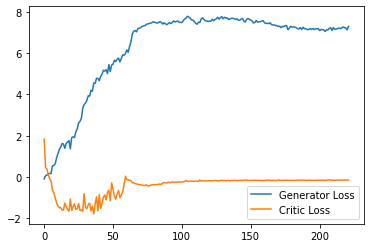

  0%|          | 0/45 [00:00<?, ?it/s]

In [11]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1


### Sampling

In [14]:
def generate_samples(gen, z_dim, device, n_samples):
    # print(gen)
    # Generate random noise vectors and corresponding one-hot labels
    noise = torch.randn(n_samples, z_dim, device=device)
    # labels = torch.randint(0, n_classes, (n_samples,), device=device)
    # print("MARK", labels)
    # one_hot_labels = torch.nn.functional.one_hot(labels, num_classes=n_classes).float()

    # Combine noise vectors and one-hot labels and generate fake images
    # noise_and_labels = torch.cat((noise, one_hot_labels), dim=1)
    with torch.no_grad():
        fake = gen(noise)

    return fake

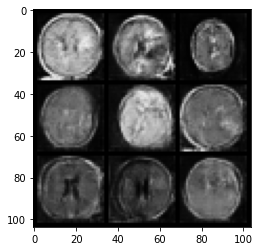

In [21]:
samples = generate_samples(gen, z_dim, device, n_samples=2900)
show_tensor_images(samples)

In [14]:
samples.shape

torch.Size([2900, 1, 32, 32])

### FID and IS score

In [15]:
# use CPU
from torchmetrics.image.fid import FrechetInceptionDistance

trainloader1 = DataLoader(train_data, batch_size=2900, shuffle=True, drop_last=True)
batch, label = next(iter(trainloader1))
print(f"Feature batch shape: {batch.shape}")
# print(f"Imgs batch shape: {imgs.shape}")


Feature batch shape: torch.Size([2900, 1, 32, 32])


In [16]:
samples = torch.cat((samples, samples, samples), dim=1)
samples.shape

torch.Size([2900, 3, 32, 32])

In [17]:
batch = torch.cat((batch, batch, batch), dim=1)
batch.shape

torch.Size([2900, 3, 32, 32])

In [18]:
samples *= 255

# Clamp values between 0 and 255
samples.clamp_(0, 255)

# Round to nearest integer
samples_uint8 = torch.round(samples).to(torch.uint8)


In [19]:
fid = FrechetInceptionDistance(normalize=True)
fid.update(batch, real=True)
fid.update(samples.cpu(), real=False)
print(f"FID: {float(fid.compute())}")
#FID: 149.07894897460938
#151.36996459960938

FID: 151.36996459960938


In [20]:
from torchmetrics.image.inception import InceptionScore
inception = InceptionScore()
inception.update(samples_uint8.cpu())
inception.compute()
#(tensor(2.3524), tensor(0.0655))
#(tensor(2.3312), tensor(0.0918))

/home/mark/.local/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(tensor(2.3312), tensor(0.0918))

In [ ]:
show_tensor_images(samples)